# Food-11 Image Classification
### Artificial Intelligence and Machine Learning

**Name:** Ananda Dhakal

**Student ID:** 2432204

This notebook covers the complete image classification pipeline on the Food-11 dataset:
- Exploratory Data Analysis
- Baseline CNN (Part A)
- Deeper CNN with Regularization (Part A)
- Optimizer Comparison & Ablation Study (Part A)
- Transfer Learning with MobileNetV2 (Part B)

In [63]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [64]:
import zipfile
import os

zip_path = '/content/drive/MyDrive/food11.zip'
extract_path = '/content/food11'

if not os.path.exists(extract_path):
    os.makedirs(extract_path)
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("extracted!")
else:
    print("already extracted")

# quick look at folder structure
for root, dirs, files in os.walk(extract_path):
    level = root.replace(extract_path, '').count(os.sep)
    if level < 2:
        indent = ' ' * 2 * level
        print(f'{indent}{os.path.basename(root)}/ ({len(files)} files)')

already extracted
food11/ (0 files)
  validation/ (0 files)
  training/ (0 files)
  evaluation/ (0 files)


In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import random
import time

sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 100
random.seed(42)

## 1. Exploratory Data Analysis
This section examines the Food-11 dataset — its folder structure, class balance across splits, and general image characteristics — before any modelling begins.

In [ ]:
BASE_PATH = '/content/food11'
TRAIN_DIR = os.path.join(BASE_PATH, 'training')
VAL_DIR = os.path.join(BASE_PATH, 'validation')
EVAL_DIR = os.path.join(BASE_PATH, 'evaluation')

# checking if all directories exist and listing classes
for d, name in [(TRAIN_DIR, 'Training'), (VAL_DIR, 'Validation'), (EVAL_DIR, 'Evaluation')]:
    if os.path.exists(d):
        classes = sorted([c for c in os.listdir(d) if os.path.isdir(os.path.join(d, c))])
        print(f"{name}: {len(classes)} classes -> {classes}")
    else:
        print(f"{name}: NOT FOUND")

Training: 11 classes -> ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
Validation: 11 classes -> ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
Evaluation: 11 classes -> ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']


In [ ]:
def build_dataframe(directory, split_name):
    data = []
    if not os.path.exists(directory):
        return pd.DataFrame(data)
    for class_name in sorted(os.listdir(directory)):
        class_dir = os.path.join(directory, class_name)
        if not os.path.isdir(class_dir):
            continue
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                data.append({
                    'image_path': os.path.join(class_dir, img_name),
                    'class_name': class_name,
                    'split': split_name,
                    'filename': img_name
                })
    return pd.DataFrame(data)

train_df = build_dataframe(TRAIN_DIR, 'Training')
val_df = build_dataframe(VAL_DIR, 'Validation')
eval_df = build_dataframe(EVAL_DIR, 'Evaluation')
all_df = pd.concat([train_df, val_df, eval_df], ignore_index=True)

print(f"training:   {len(train_df)}")
print(f"validation: {len(val_df)}")
print(f"evaluation: {len(eval_df)}")
print(f"total:      {len(all_df)}")

training:   9866
validation: 3430
evaluation: 3347
total:      16643


In [ ]:
# class distribution across splits
dist_table = all_df.groupby(['class_name', 'split']).size().unstack(fill_value=0)
for col in ['Training', 'Validation', 'Evaluation']:
    if col not in dist_table.columns:
        dist_table[col] = 0
dist_table['Total'] = dist_table[['Training', 'Validation', 'Evaluation']].sum(axis=1)
dist_table = dist_table[['Training', 'Validation', 'Evaluation', 'Total']]
dist_table = dist_table.sort_values('Total', ascending=False)
print(dist_table)
print(f"\nlargest class:  {dist_table.index[0]} ({dist_table['Total'].iloc[0]})")
print(f"smallest class: {dist_table.index[-1]} ({dist_table['Total'].iloc[-1]})")
print(f"imbalance ratio: {dist_table['Total'].iloc[0] / dist_table['Total'].iloc[-1]:.1f}x")

split            Training  Validation  Evaluation  Total
class_name                                              
Dessert              1500         500         500   2500
Soup                 1500         500         500   2500
Meat                 1325         449         432   2206
Bread                 994         362         368   1724
Egg                   986         327         335   1648
Seafood               855         347         303   1505
Fried food            848         326         287   1461
Vegetable-Fruit       709         232         231   1172
Noodles-Pasta         440         147         147    734
Dairy product         429         144         148    721
Rice                  280          96          96    472

largest class:  Dessert (2500)
smallest class: Rice (472)
imbalance ratio: 5.3x


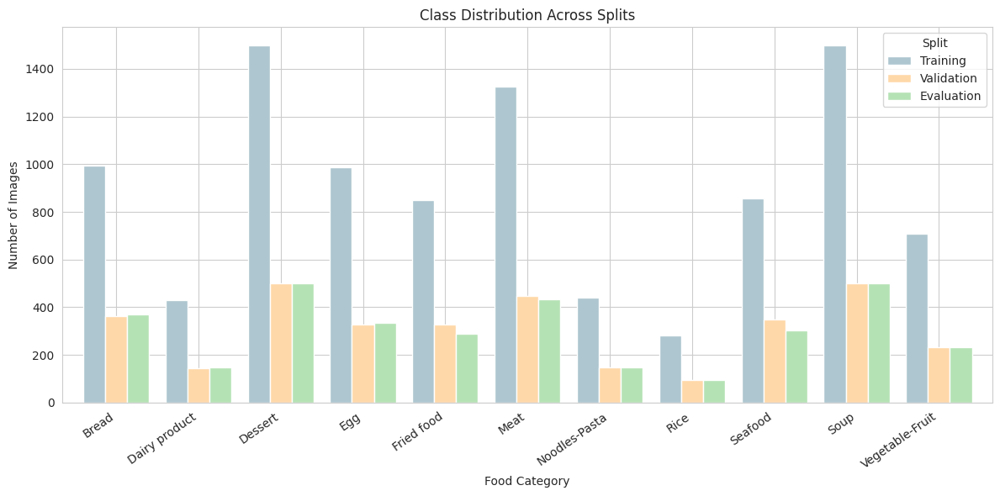

In [ ]:
# bar chart showing distribution per split
fig, ax = plt.subplots(figsize=(12, 6))
dist_for_plot = all_df.groupby(['class_name', 'split']).size().unstack(fill_value=0)
for col in ['Training', 'Validation', 'Evaluation']:
    if col not in dist_for_plot.columns:
        dist_for_plot[col] = 0
dist_for_plot = dist_for_plot[['Training', 'Validation', 'Evaluation']]
dist_for_plot.plot(kind='bar', ax=ax, color=['#AEC6CF', '#FFD8A9', '#B5E2B5'], width=0.8)
ax.set_title('Class Distribution Across Splits')
ax.set_xlabel('Food Category')
ax.set_ylabel('Number of Images')
ax.legend(title='Split')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

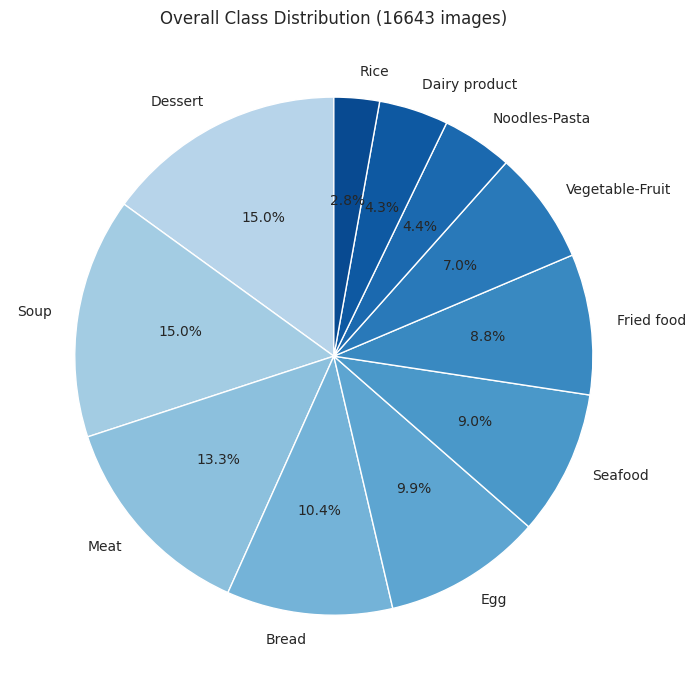

In [ ]:
# pie chart for overall distribution
class_totals = all_df['class_name'].value_counts()
fig, ax = plt.subplots(figsize=(9, 7))
colors = plt.cm.Blues(np.linspace(0.3, 0.9, len(class_totals)))
ax.pie(class_totals.values, labels=class_totals.index, autopct='%1.1f%%',
       colors=colors, startangle=90, textprops={'fontsize': 10})
ax.set_title(f'Overall Class Distribution ({len(all_df)} images)')
plt.tight_layout()
plt.show()

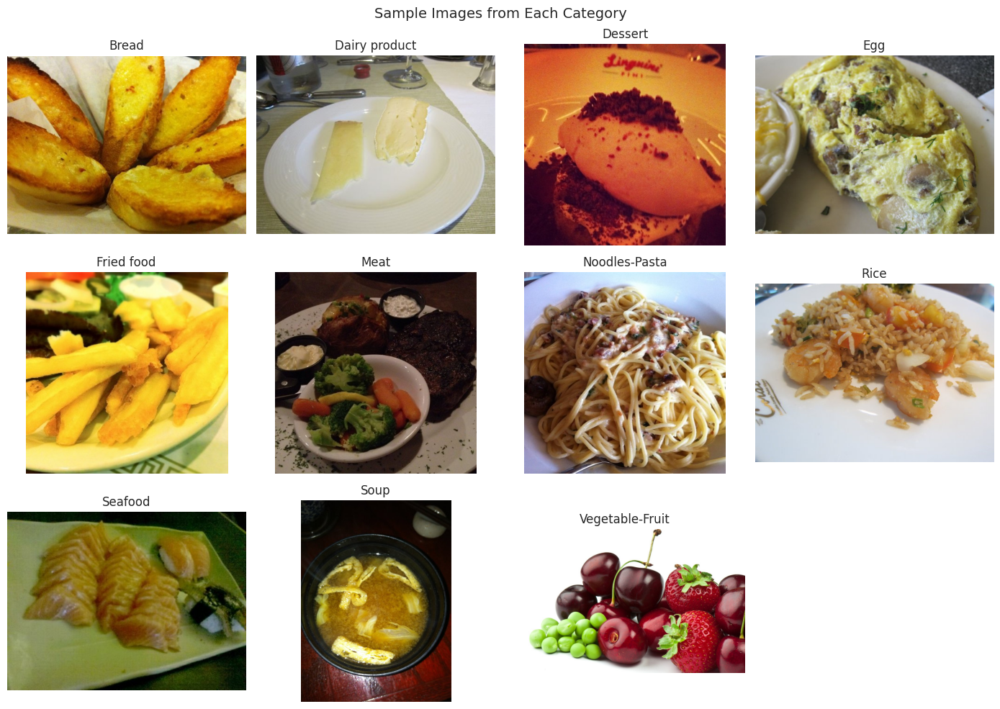

In [ ]:
# one sample image from each class
classes = sorted(all_df['class_name'].unique())
n_classes = len(classes)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
axes = axes.flatten()
for idx, class_name in enumerate(classes):
    class_images = train_df[train_df['class_name'] == class_name]['image_path'].tolist()
    if class_images:
        img = Image.open(random.choice(class_images))
        axes[idx].imshow(img)
        axes[idx].set_title(class_name)
        axes[idx].axis('off')
for idx in range(n_classes, len(axes)):
    axes[idx].axis('off')
plt.suptitle('Sample Images from Each Category', fontsize=14)
plt.tight_layout()
plt.show()

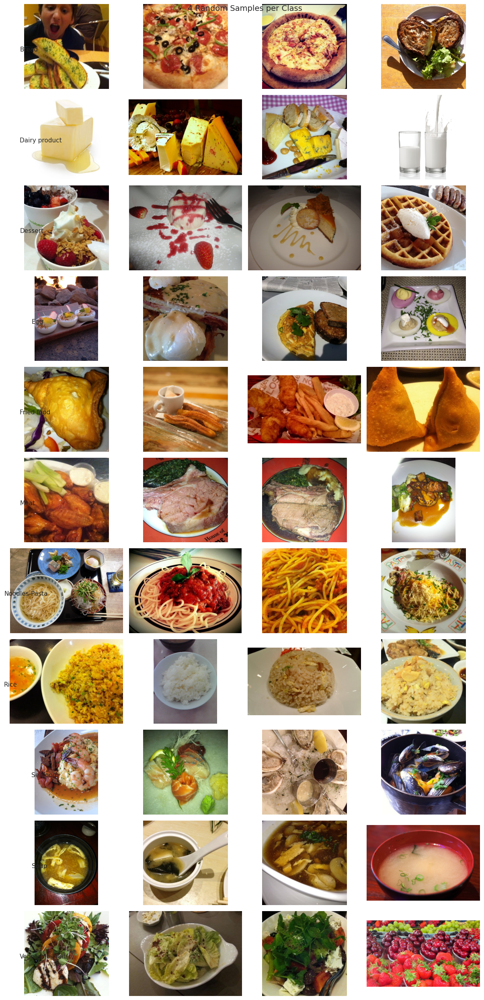

In [ ]:
# 4 random samples per class
fig, axes = plt.subplots(n_classes, 4, figsize=(12, 2.3 * n_classes))
for i, class_name in enumerate(classes):
    class_images = train_df[train_df['class_name'] == class_name]['image_path'].tolist()
    samples = random.sample(class_images, min(4, len(class_images)))
    for j in range(4):
        if j < len(samples):
            img = Image.open(samples[j])
            axes[i, j].imshow(img)
        axes[i, j].axis('off')
        if j == 0:
            axes[i, j].set_title(class_name, fontsize=11, loc='left', x=-0.05, y=0.4)
plt.suptitle('4 Random Samples per Class', fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# checking image dimensions
sample_df = train_df.sample(n=min(500, len(train_df)), random_state=42)
widths, heights, aspect_ratios = [], [], []
for path in sample_df['image_path']:
    try:
        img = Image.open(path)
        w, h = img.size
        widths.append(w)
        heights.append(h)
        aspect_ratios.append(w / h)
    except:
        continue

print(f"width  - min: {min(widths)}, max: {max(widths)}, avg: {np.mean(widths):.0f}")
print(f"height - min: {min(heights)}, max: {max(heights)}, avg: {np.mean(heights):.0f}")
print(f"aspect ratio - avg: {np.mean(aspect_ratios):.2f}")

width  - min: 280, max: 2118, avg: 514
height - min: 287, max: 1418, avg: 479
aspect ratio - avg: 1.10


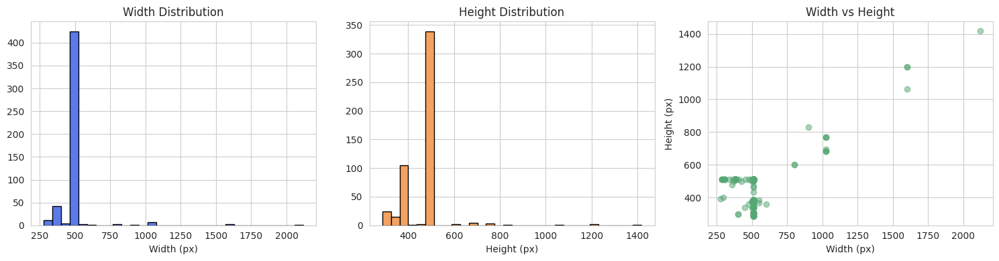

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].hist(widths, bins=30, color='#5C7AEA', edgecolor='black')
axes[0].set_title('Width Distribution')
axes[0].set_xlabel('Width (px)')
axes[1].hist(heights, bins=30, color='#F4A261', edgecolor='black')
axes[1].set_title('Height Distribution')
axes[1].set_xlabel('Height (px)')
axes[2].scatter(widths, heights, alpha=0.5, color='#57A773')
axes[2].set_title('Width vs Height')
axes[2].set_xlabel('Width (px)')
axes[2].set_ylabel('Height (px)')
plt.tight_layout()
plt.show()

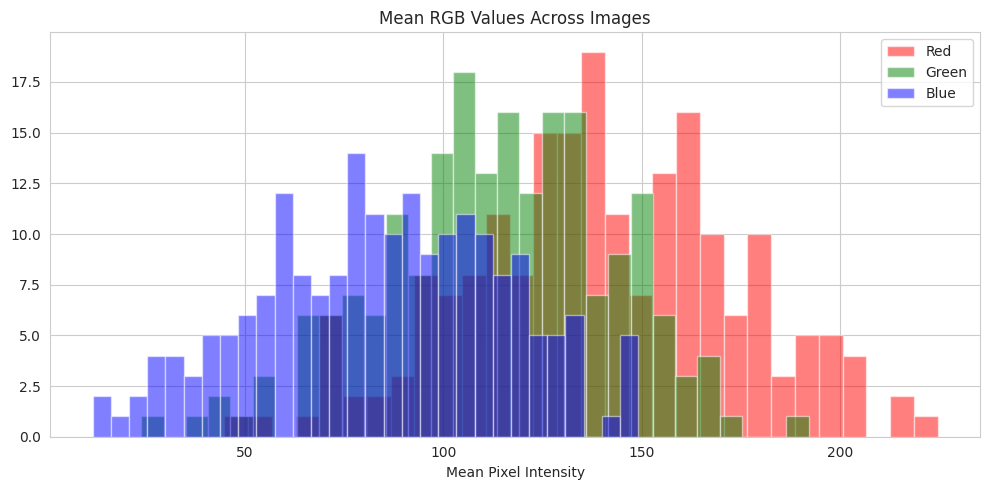

avg R: 139.6, G: 113.4, B: 84.6


In [ ]:
# mean RGB values across a sample of images
sample_color = train_df.sample(n=min(200, len(train_df)), random_state=42)
r_means, g_means, b_means = [], [], []
for path in sample_color['image_path']:
    try:
        img = np.array(Image.open(path).convert('RGB'))
        r_means.append(img[:,:,0].mean())
        g_means.append(img[:,:,1].mean())
        b_means.append(img[:,:,2].mean())
    except:
        continue

fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(r_means, bins=30, alpha=0.5, color='red', label='Red')
ax.hist(g_means, bins=30, alpha=0.5, color='green', label='Green')
ax.hist(b_means, bins=30, alpha=0.5, color='blue', label='Blue')
ax.set_title('Mean RGB Values Across Images')
ax.set_xlabel('Mean Pixel Intensity')
ax.legend()
plt.tight_layout()
plt.show()
print(f"avg R: {np.mean(r_means):.1f}, G: {np.mean(g_means):.1f}, B: {np.mean(b_means):.1f}")

In [ ]:
print("EDA Summary")
print(f"total images: {len(all_df)}")
print(f"classes: {all_df['class_name'].nunique()}")
print(f"train/val/eval: {len(train_df)}/{len(val_df)}/{len(eval_df)}")
print(f"imbalance: {class_totals.max()}/{class_totals.min()} = {class_totals.max()/class_totals.min():.1f}x")
print(f"images have different sizes so we need to resize them")

EDA Summary
total images: 16643
classes: 11
train/val/eval: 9866/3430/3347
imbalance: 2500/472 = 5.3x
images have different sizes so we need to resize them


## 2. Data Preprocessing and Augmentation
All images are resized to 128×128 and pixel values normalised to [0, 1]. Random augmentation (flips, rotations, zoom) is applied to the training set to improve generalisation.

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("tensorflow:", tf.__version__)
print("gpu:", tf.config.list_physical_devices('GPU'))

tensorflow: 2.20.0
gpu: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
IMG_SIZE = (128, 128)
BATCH_SIZE = 64
NUM_CLASSES = 11

# training data gets augmented, val and eval dont
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(rescale=1./255)
eval_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=True, seed=42
)
val_generator = val_datagen.flow_from_directory(
    VAL_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=False
)
eval_generator = eval_datagen.flow_from_directory(
    EVAL_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=False
)

Found 9866 images belonging to 11 classes.
Found 3430 images belonging to 11 classes.
Found 3347 images belonging to 11 classes.


In [ ]:
class_indices = train_generator.class_indices
class_names = list(class_indices.keys())
print("classes:", class_names)
print(f"train: {train_generator.samples}, val: {val_generator.samples}, eval: {eval_generator.samples}")

classes: ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
train: 9866, val: 3430, eval: 3347


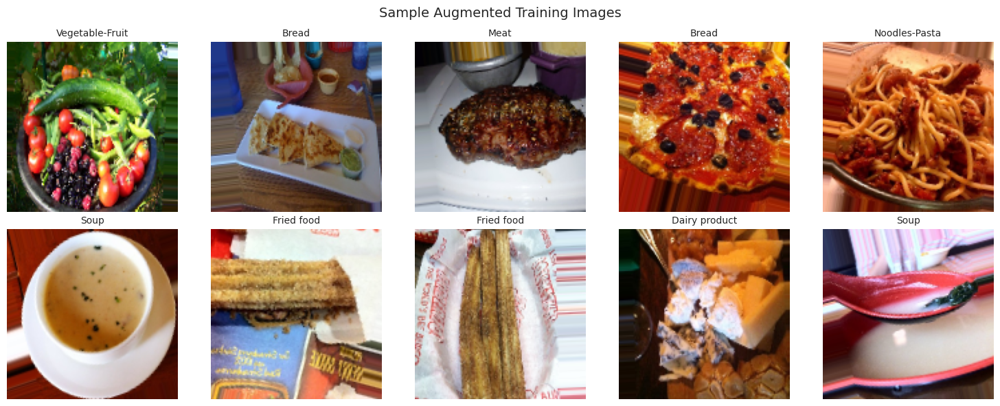

In [ ]:
# showing some augmented training images
batch_x, batch_y = next(train_generator)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axes.flatten()):
    ax.imshow(batch_x[i])
    ax.set_title(class_names[np.argmax(batch_y[i])], fontsize=10)
    ax.axis('off')
plt.suptitle('Sample Augmented Training Images', fontsize=14)
plt.tight_layout()
plt.show()

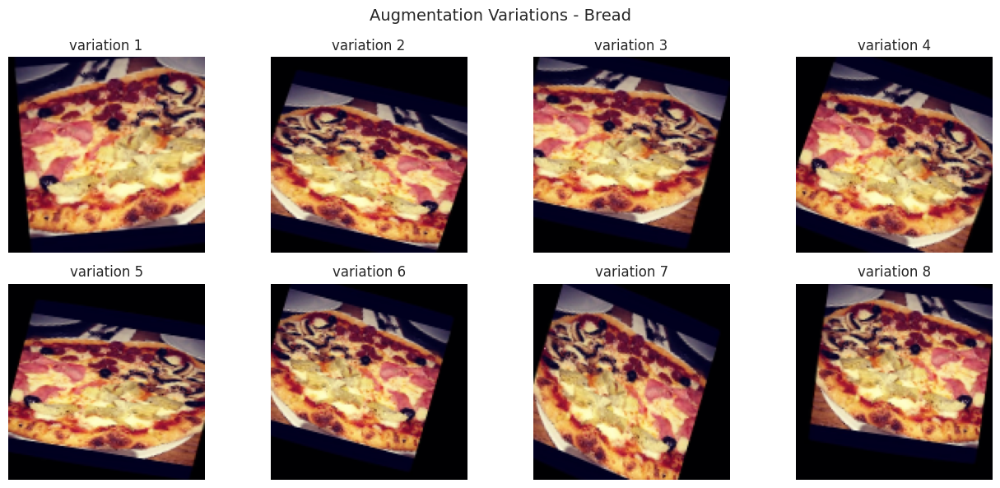

In [ ]:
# showing how augmentation changes a single image
from tensorflow.keras.preprocessing import image

sample_class = class_names[0]
sample_dir = os.path.join(TRAIN_DIR, sample_class)
sample_file = os.path.join(sample_dir, os.listdir(sample_dir)[0])

img = image.load_img(sample_file, target_size=IMG_SIZE)
x = image.img_to_array(img).reshape((1,) + image.img_to_array(img).shape)

fig, axes = plt.subplots(2, 4, figsize=(13, 6))
i = 0
for batch in train_datagen.flow(x, batch_size=1, seed=42):
    axes.flatten()[i].imshow(batch[0])
    axes.flatten()[i].set_title(f'variation {i+1}')
    axes.flatten()[i].axis('off')
    i += 1
    if i >= 8: break
plt.suptitle(f'Augmentation Variations - {sample_class}', fontsize=14)
plt.tight_layout()
plt.show()

## 3. Part A - Baseline CNN Model
A lightweight CNN with 3 convolutional blocks and 3 dense layers serves as the baseline. No regularisation is applied here — the aim is to establish a reference point before adding complexity.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input, BatchNormalization, Dropout

def build_baseline_cnn(input_shape=(128, 128, 3), num_classes=11):
    model = Sequential(name="Baseline_CNN")
    model.add(Input(shape=input_shape))

    # Block 1
    model.add(Conv2D(32, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))
    model.add(Dropout(0.25))

    # Block 2
    model.add(Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))
    model.add(Dropout(0.25))

    # Block 3
    model.add(Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))
    model.add(Dropout(0.3))

    model.add(Flatten())
    model.add(Dense(256, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation="softmax"))
    return model

baseline_model = build_baseline_cnn()
baseline_model.summary()


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     8,388,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 11)             │         2,827 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,486,859 (32.37 MB)

 Trainable params: 8,485,899 (32.37 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
from tensorflow.keras.layers import Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

baseline_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)
print(f"params: {baseline_model.count_params():,}")


params: 8,486,859


In [ ]:
from sklearn.utils import class_weight
import numpy as np

def get_callbacks():
    return [
        EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6, verbose=1)
    ]

# Calculate class weights for imbalanced dataset
# Map class names to integer indices as expected by class_weight.compute_class_weight
class_labels = train_df['class_name'].unique()
class_to_idx = {name: i for i, name in enumerate(sorted(class_labels))}
class_indices_for_weights = np.array([class_to_idx[name] for name in train_df['class_name']])

# Compute class weights
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(class_indices_for_weights),
    y=class_indices_for_weights
)
class_weight_dict = dict(enumerate(class_weights_array))

start_time = time.time()
baseline_history = baseline_model.fit(
    train_generator, epochs=20,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
baseline_time = time.time() - start_time
print(f"done in {baseline_time:.1f}s ({baseline_time/60:.1f} min)")

Epoch 1/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 111s 628ms/step - accuracy: 0.2382 - loss: 2.4004 - val_accuracy: 0.1609 - val_loss: 4.4173 - learning_rate: 0.0010
Epoch 2/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 95s 612ms/step - accuracy: 0.3222 - loss: 1.9445 - val_accuracy: 0.0706 - val_loss: 5.8029 - learning_rate: 0.0010
Epoch 3/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 88s 567ms/step - accuracy: 0.3761 - loss: 1.7675 - val_accuracy: 0.2318 - val_loss: 4.0610 - learning_rate: 0.0010
Epoch 4/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 85s 548ms/step - accuracy: 0.3944 - loss: 1.7068 - val_accuracy: 0.1662 - val_loss: 4.8766 - learning_rate: 0.0010
Epoch 5/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step - accuracy: 0.4122 - loss: 1.6587
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
155/155 ━━━━━━━━━━━━━━━━━━━━ 90s 581ms/step - accuracy: 0.3998 - loss: 1.6891 - val_accuracy: 0.0679 - val_loss: 7.0723 - learning_rate: 0.0010
Epoch 6/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 86s 556ms/step - accuracy: 0.41

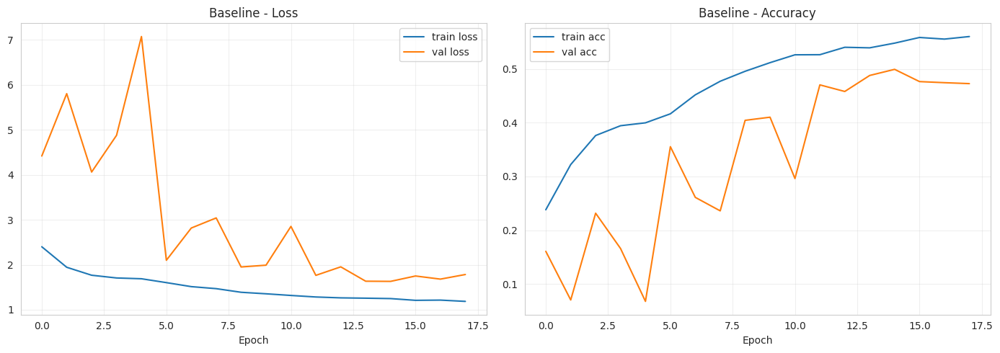

In [ ]:
# loss and accuracy curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(baseline_history.history['loss'], label='train loss')
axes[0].plot(baseline_history.history['val_loss'], label='val loss')
axes[0].set_title('Baseline - Loss')
axes[0].set_xlabel('Epoch')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(baseline_history.history['accuracy'], label='train acc')
axes[1].plot(baseline_history.history['val_accuracy'], label='val acc')
axes[1].set_title('Baseline - Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# evaluating on test set
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

baseline_loss, baseline_acc = baseline_model.evaluate(eval_generator, verbose=1)

eval_generator.reset()
y_pred = np.argmax(baseline_model.predict(eval_generator), axis=1)
y_true = eval_generator.classes

acc = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f"\naccuracy:  {acc*100:.2f}%")
print(f"precision: {precision*100:.2f}%")
print(f"recall:    {recall*100:.2f}%")
print(f"f1 score:  {f1*100:.2f}%")
print()
print(classification_report(y_true, y_pred, target_names=class_names))

53/53 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - accuracy: 0.5214 - loss: 1.5212
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step

accuracy:  52.14%
precision: 58.33%
recall:    52.14%
f1 score:  49.78%

                 precision    recall  f1-score   support

          Bread       0.41      0.39      0.40       368
  Dairy product       0.38      0.30      0.33       148
        Dessert       0.67      0.20      0.30       500
            Egg       0.59      0.33      0.42       335
     Fried food       0.71      0.50      0.59       287
           Meat       0.46      0.84      0.60       432
  Noodles-Pasta       0.38      0.75      0.50       147
           Rice       0.48      0.61      0.54        96
        Seafood       0.86      0.30      0.44       303
           Soup       0.70      0.72      0.71       500
Vegetable-Fruit       0.42      0.97      0.59       231

       accuracy                           0.52      3347
      macro avg       0.55      0.54      0.49      3347
   weigh

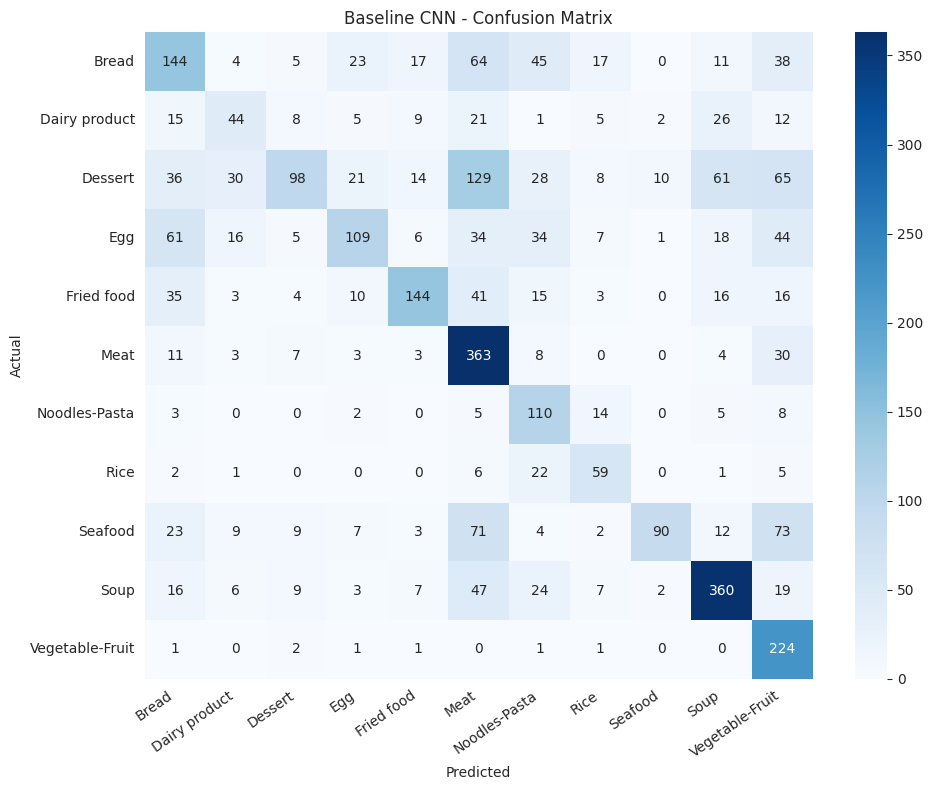

In [ ]:
# confusion matrix
cm = confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_title('Baseline CNN - Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

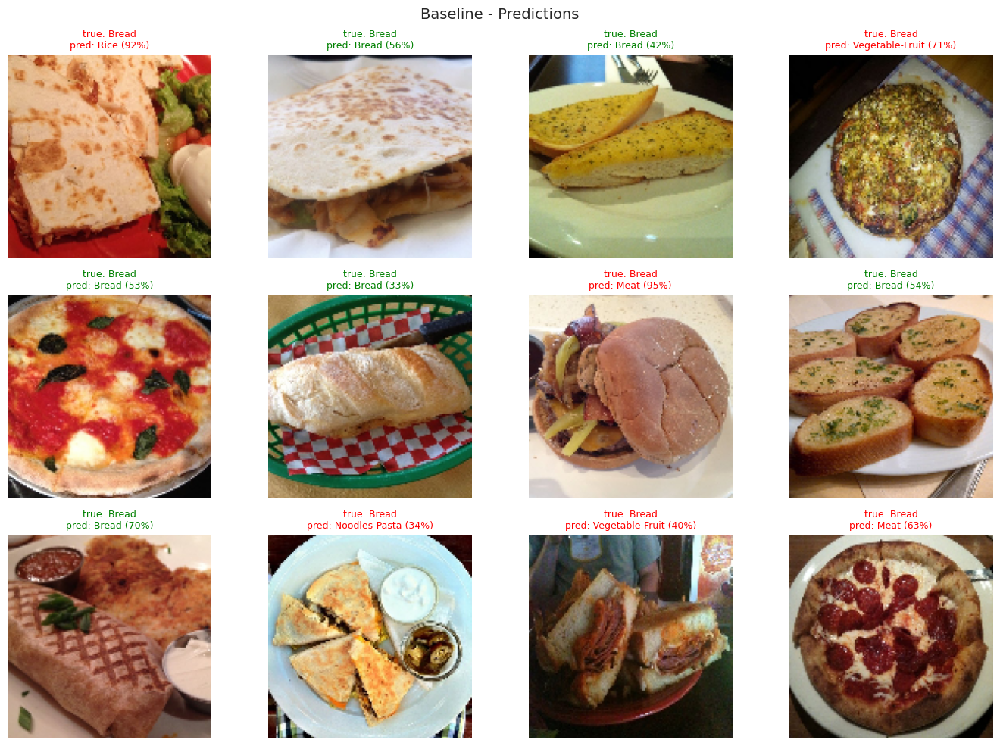

In [ ]:
# sample predictions
eval_generator.reset()
sx, sy = next(eval_generator)
sp = baseline_model.predict(sx, verbose=0)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
for i, ax in enumerate(axes.flatten()):
    if i < len(sx):
        ax.imshow(sx[i])
        true_c = class_names[np.argmax(sy[i])]
        pred_c = class_names[np.argmax(sp[i])]
        conf = np.max(sp[i]) * 100
        color = 'green' if true_c == pred_c else 'red'
        ax.set_title(f'true: {true_c}\npred: {pred_c} ({conf:.0f}%)', fontsize=9, color=color)
        ax.axis('off')
plt.suptitle('Baseline - Predictions', fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# saving baseline results for later comparison
baseline_results = {
    'accuracy': acc, 'precision': precision, 'recall': recall,
    'f1_score': f1, 'eval_loss': baseline_loss,
    'training_time_sec': baseline_time,
    'epochs_trained': len(baseline_history.history['loss']),
    'total_params': baseline_model.count_params(),
    'history': baseline_history.history
}
baseline_model.save('/content/baseline_cnn.keras')
print("baseline saved")

baseline saved


## 4. Deeper CNN with Regularization
The architecture is extended to 6 convolutional layers (twice the baseline depth). Batch Normalisation and Dropout are added throughout to constrain overfitting.

In [ ]:
from tensorflow.keras.layers import Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


In [ ]:
def build_deeper_cnn(input_shape=(128, 128, 3), num_classes=11):
    model = Sequential(name="Deeper_CNN")
    model.add(Input(shape=input_shape))

    # Block 1 - two conv layers
    model.add(Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))
    model.add(Dropout(0.25))

    # Block 2
    model.add(Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))
    model.add(Dropout(0.3))

    # Block 3
    model.add(Conv2D(256, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))
    model.add(Dropout(0.3))

    # GlobalAveragePooling is much faster than Flatten for deep nets
    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation="softmax"))
    return model

deeper_model = build_deeper_cnn()
deeper_model.summary()


Model: "Deeper_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 128, 128, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 64, 64, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 11)             │         2,827 │
└─────────────────────────────────┴────────────────────────┴─────────────

 Total params: 627,531 (2.39 MB)

 Trainable params: 625,739 (2.39 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [ ]:
# quick comparison of model sizes
print(f"baseline params: {baseline_model.count_params():,}")
print(f"deeper params:   {deeper_model.count_params():,}")

baseline params: 8,486,859
deeper params:   627,531


In [ ]:
deeper_model.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

start_time = time.time()
deeper_history = deeper_model.fit(
    train_generator, epochs=20,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
deeper_time = time.time() - start_time
print(f"done in {deeper_time:.1f}s ({deeper_time/60:.1f} min)")


Epoch 1/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 154s 774ms/step - accuracy: 0.2059 - loss: 2.6312 - val_accuracy: 0.0746 - val_loss: 3.1019 - learning_rate: 5.0000e-04
Epoch 2/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 94s 604ms/step - accuracy: 0.2626 - loss: 2.2941 - val_accuracy: 0.0948 - val_loss: 3.4902 - learning_rate: 5.0000e-04
Epoch 3/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 0s 532ms/step - accuracy: 0.2973 - loss: 2.1111
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
155/155 ━━━━━━━━━━━━━━━━━━━━ 94s 607ms/step - accuracy: 0.3039 - loss: 2.0830 - val_accuracy: 0.1659 - val_loss: 3.3485 - learning_rate: 5.0000e-04
Epoch 4/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 94s 604ms/step - accuracy: 0.3454 - loss: 1.8964 - val_accuracy: 0.2423 - val_loss: 2.3090 - learning_rate: 2.5000e-04
Epoch 5/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 93s 602ms/step - accuracy: 0.3717 - loss: 1.8041 - val_accuracy: 0.3799 - val_loss: 1.8178 - learning_rate: 2.5000e-04
Epoch 6/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 94s 608ms/s

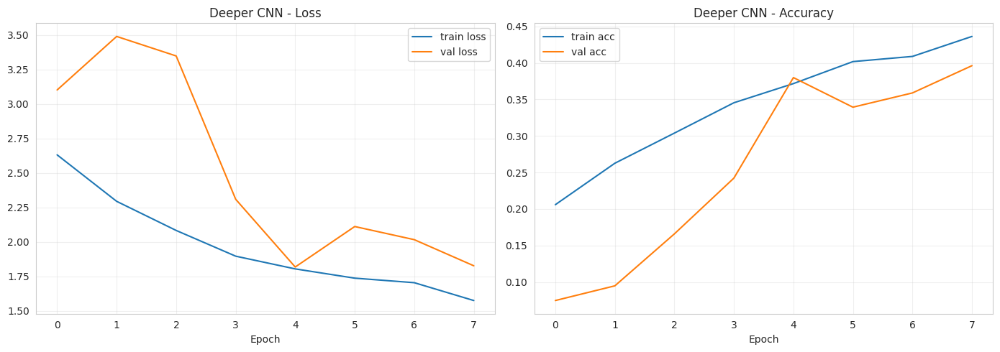

In [ ]:
# deeper model curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(deeper_history.history['loss'], label='train loss')
axes[0].plot(deeper_history.history['val_loss'], label='val loss')
axes[0].set_title('Deeper CNN - Loss')
axes[0].set_xlabel('Epoch')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(deeper_history.history['accuracy'], label='train acc')
axes[1].plot(deeper_history.history['val_accuracy'], label='val acc')
axes[1].set_title('Deeper CNN - Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

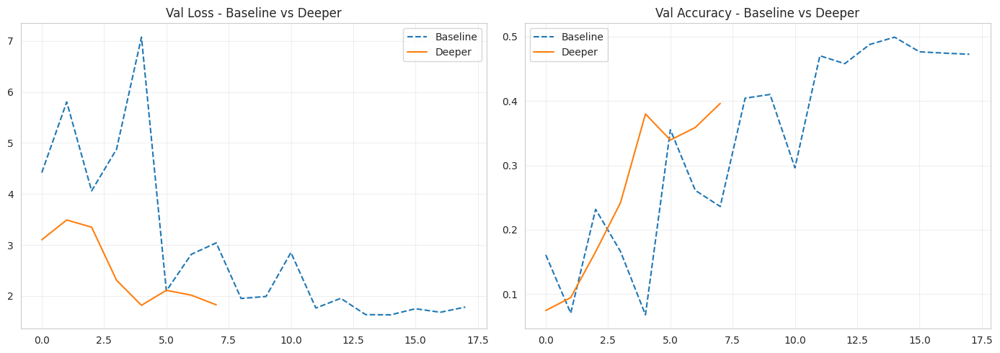

In [ ]:
# comparing baseline vs deeper validation curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(baseline_results['history']['val_loss'], label='Baseline', linestyle='--')
axes[0].plot(deeper_history.history['val_loss'], label='Deeper')
axes[0].set_title('Val Loss - Baseline vs Deeper')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(baseline_results['history']['val_accuracy'], label='Baseline', linestyle='--')
axes[1].plot(deeper_history.history['val_accuracy'], label='Deeper')
axes[1].set_title('Val Accuracy - Baseline vs Deeper')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# deeper model evaluation
deeper_loss, deeper_acc_raw = deeper_model.evaluate(eval_generator, verbose=1)

eval_generator.reset()
y_pred_deep = np.argmax(deeper_model.predict(eval_generator), axis=1)
y_true = eval_generator.classes

acc_deep = accuracy_score(y_true, y_pred_deep)
prec_deep = precision_score(y_true, y_pred_deep, average='weighted')
rec_deep = recall_score(y_true, y_pred_deep, average='weighted')
f1_deep = f1_score(y_true, y_pred_deep, average='weighted')

print(f"\naccuracy:  {acc_deep*100:.2f}%")
print(f"precision: {prec_deep*100:.2f}%")
print(f"recall:    {rec_deep*100:.2f}%")
print(f"f1 score:  {f1_deep*100:.2f}%")
print()
print(classification_report(y_true, y_pred_deep, target_names=class_names))

53/53 ━━━━━━━━━━━━━━━━━━━━ 15s 274ms/step - accuracy: 0.4090 - loss: 1.7205
45/53 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step

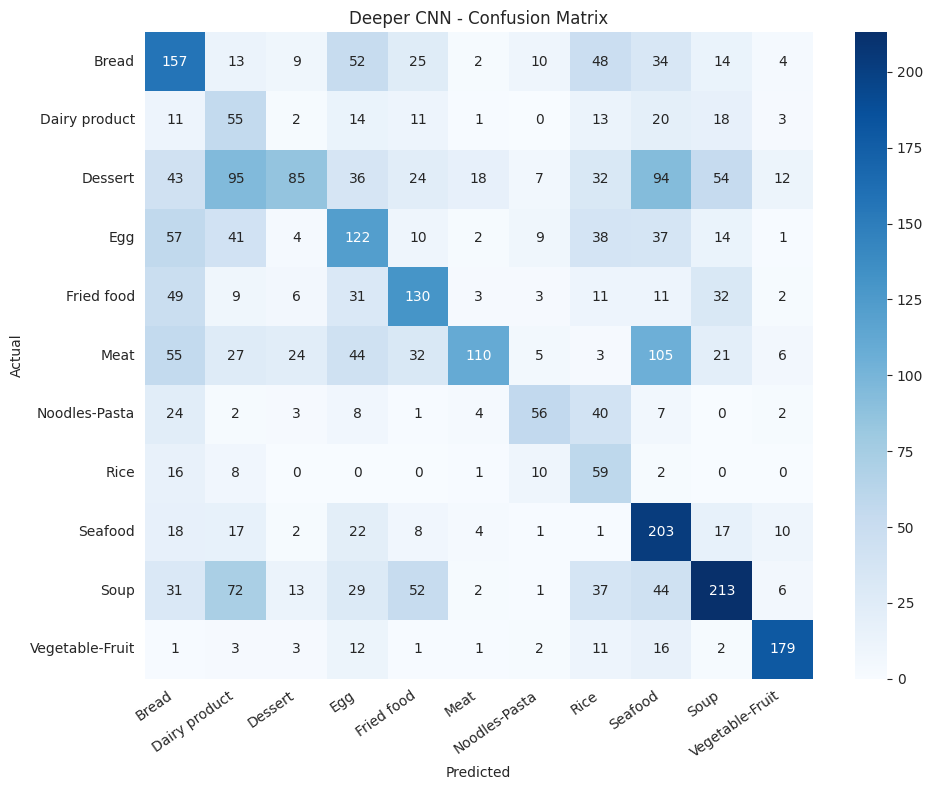

In [ ]:
# confusion matrix for deeper model
cm_deep = confusion_matrix(y_true, y_pred_deep)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm_deep, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_title('Deeper CNN - Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

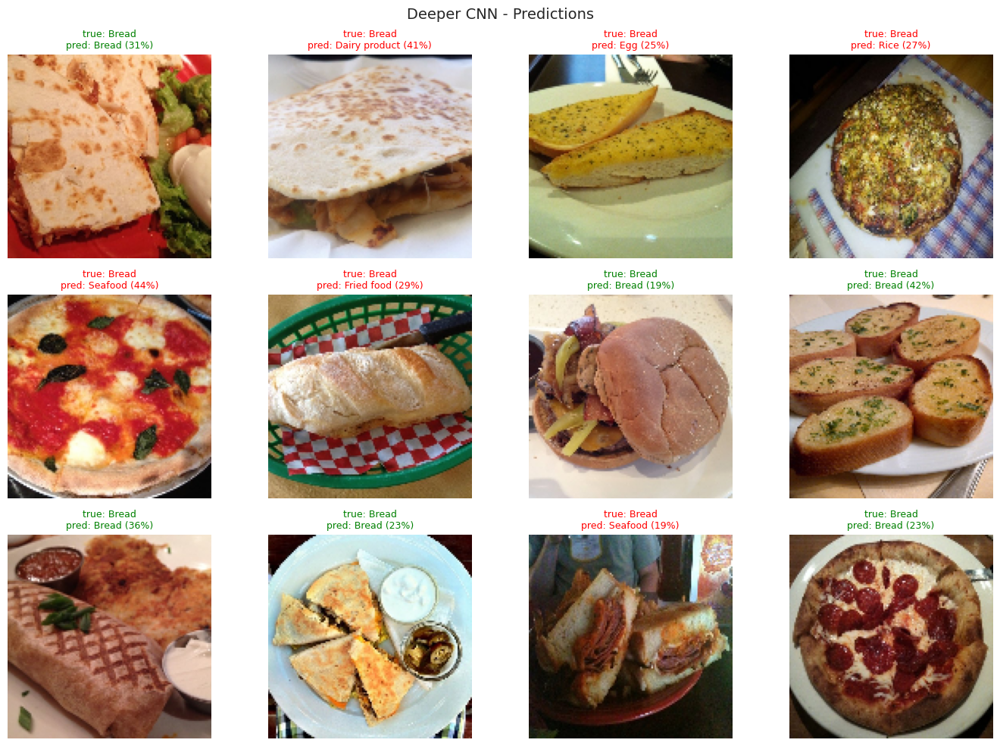

In [ ]:
# sample predictions - deeper model
eval_generator.reset()
sx, sy = next(eval_generator)
sp = deeper_model.predict(sx, verbose=0)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
for i, ax in enumerate(axes.flatten()):
    if i < len(sx):
        ax.imshow(sx[i])
        true_c = class_names[np.argmax(sy[i])]
        pred_c = class_names[np.argmax(sp[i])]
        conf = np.max(sp[i]) * 100
        color = 'green' if true_c == pred_c else 'red'
        ax.set_title(f'true: {true_c}\npred: {pred_c} ({conf:.0f}%)', fontsize=9, color=color)
        ax.axis('off')
plt.suptitle('Deeper CNN - Predictions', fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
deeper_results = {
    'accuracy': acc_deep, 'precision': prec_deep, 'recall': rec_deep,
    'f1_score': f1_deep, 'eval_loss': deeper_loss,
    'training_time_sec': deeper_time,
    'epochs_trained': len(deeper_history.history['loss']),
    'total_params': deeper_model.count_params(),
    'history': deeper_history.history
}

# quick comparison so far
print(f"{'':20s} {'Baseline':>10s} {'Deeper':>10s}")
print(f"{'accuracy':20s} {baseline_results['accuracy']*100:>9.2f}% {acc_deep*100:>9.2f}%")
print(f"{'f1 score':20s} {baseline_results['f1_score']*100:>9.2f}% {f1_deep*100:>9.2f}%")
print(f"{'training time':20s} {baseline_results['training_time_sec']:>9.1f}s {deeper_time:>9.1f}s")

deeper_model.save('/content/deeper_cnn.keras')

                       Baseline     Deeper
accuracy                 52.14%     40.90%
f1 score                 49.78%     40.89%
training time           1591.3s     810.0s


## 5. Experimentation
### 5.1 Optimizer Comparison: SGD vs Adam
The same deeper model is retrained using SGD to compare its learning dynamics and final accuracy against Adam.

In [ ]:
from tensorflow.keras.optimizers import SGD

deeper_sgd = build_deeper_cnn()
deeper_sgd.compile(
    optimizer=SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

start_time = time.time()
sgd_history = deeper_sgd.fit(
    train_generator, epochs=20,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
sgd_time = time.time() - start_time
print(f"sgd training done in {sgd_time:.1f}s")


Epoch 1/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 110s 651ms/step - accuracy: 0.1738 - loss: 2.6114 - val_accuracy: 0.0837 - val_loss: 3.0071 - learning_rate: 0.0100
Epoch 2/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 95s 612ms/step - accuracy: 0.2255 - loss: 2.2349 - val_accuracy: 0.1146 - val_loss: 2.6598 - learning_rate: 0.0100
Epoch 3/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 92s 593ms/step - accuracy: 0.2564 - loss: 2.1104 - val_accuracy: 0.1950 - val_loss: 2.3333 - learning_rate: 0.0100
Epoch 4/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 94s 604ms/step - accuracy: 0.2983 - loss: 1.9801 - val_accuracy: 0.1399 - val_loss: 2.9970 - learning_rate: 0.0100
Epoch 5/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 102s 655ms/step - accuracy: 0.3221 - loss: 1.9251 - val_accuracy: 0.3029 - val_loss: 2.0707 - learning_rate: 0.0100
Epoch 6/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 95s 611ms/step - accuracy: 0.3440 - loss: 1.8410 - val_accuracy: 0.3219 - val_loss: 2.0137 - learning_rate: 0.0100
Epoch 7/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 93s 597ms/step - accuracy: 0

In [ ]:
# sgd evaluation
eval_generator.reset()
sgd_loss, _ = deeper_sgd.evaluate(eval_generator, verbose=1)
eval_generator.reset()
y_pred_sgd = np.argmax(deeper_sgd.predict(eval_generator), axis=1)
y_true = eval_generator.classes

acc_sgd = accuracy_score(y_true, y_pred_sgd)
prec_sgd = precision_score(y_true, y_pred_sgd, average='weighted')
rec_sgd = recall_score(y_true, y_pred_sgd, average='weighted')
f1_sgd = f1_score(y_true, y_pred_sgd, average='weighted')

print(f"sgd accuracy: {acc_sgd*100:.2f}%, f1: {f1_sgd*100:.2f}%")

53/53 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - accuracy: 0.5151 - loss: 1.4060
53/53 ━━━━━━━━━━━━━━━━━━━━ 13s 234ms/step
sgd accuracy: 51.51%, f1: 51.80%


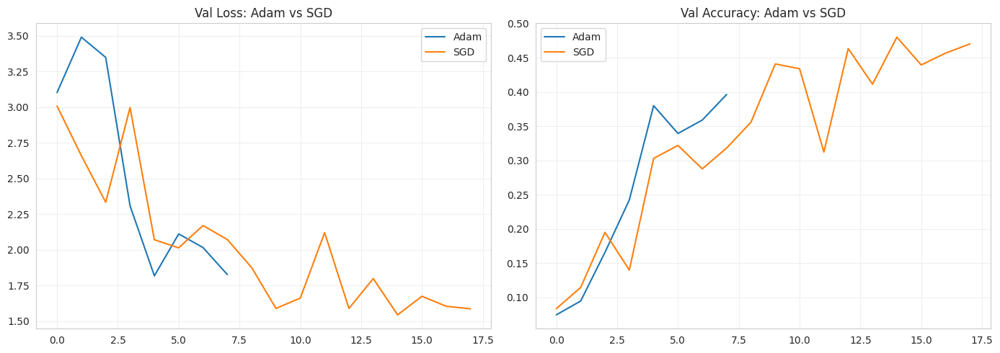


                      Adam        SGD
accuracy            40.90%     51.51%
f1 score            40.89%     51.80%
time                810.0s    1767.2s


In [70]:
# adam vs sgd curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(deeper_results['history']['val_loss'], label='Adam')
axes[0].plot(sgd_history.history['val_loss'], label='SGD')
axes[0].set_title('Val Loss: Adam vs SGD')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(deeper_results['history']['val_accuracy'], label='Adam')
axes[1].plot(sgd_history.history['val_accuracy'], label='SGD')
axes[1].set_title('Val Accuracy: Adam vs SGD')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

sgd_results = {
    'accuracy': acc_sgd, 'precision': prec_sgd, 'recall': rec_sgd,
    'f1_score': f1_sgd, 'eval_loss': sgd_loss,
    'training_time_sec': sgd_time,
    'epochs_trained': len(sgd_history.history['loss']),
    'history': sgd_history.history
}

print(f"\n{'':15s} {'Adam':>10s} {'SGD':>10s}")
print(f"{'accuracy':15s} {deeper_results['accuracy']*100:>9.2f}% {acc_sgd*100:>9.2f}%")
print(f"{'f1 score':15s} {deeper_results['f1_score']*100:>9.2f}% {f1_sgd*100:>9.2f}%")
print(f"{'time':15s} {deeper_results['training_time_sec']:>9.1f}s {sgd_time:>9.1f}s")

### 5.2 Ablation Study - Removing Dropout
All Dropout layers are removed from the deeper model to isolate their contribution. Comparing this variant against the full model reveals how much regularisation they provide.

In [ ]:
def build_no_dropout(input_shape=(128, 128, 3), num_classes=11):
    model = Sequential(name="No_Dropout")
    model.add(Input(shape=input_shape))

    model.add(Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))

    model.add(Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))

    model.add(Conv2D(256, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))

    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dense(num_classes, activation="softmax"))
    return model

ablation_model = build_no_dropout()
ablation_model.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

start_time = time.time()
ablation_history = ablation_model.fit(
    train_generator, epochs=20,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
abl_time = time.time() - start_time
print(f"ablation done in {abl_time:.1f}s")


Epoch 1/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 106s 627ms/step - accuracy: 0.2924 - loss: 2.0023 - val_accuracy: 0.1458 - val_loss: 3.4656 - learning_rate: 5.0000e-04
Epoch 2/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 92s 594ms/step - accuracy: 0.3762 - loss: 1.7509 - val_accuracy: 0.1458 - val_loss: 4.8965 - learning_rate: 5.0000e-04
Epoch 3/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 102s 658ms/step - accuracy: 0.4379 - loss: 1.5864 - val_accuracy: 0.1980 - val_loss: 3.3560 - learning_rate: 5.0000e-04
Epoch 4/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 94s 608ms/step - accuracy: 0.4756 - loss: 1.4623 - val_accuracy: 0.3790 - val_loss: 1.8172 - learning_rate: 5.0000e-04
Epoch 5/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 93s 597ms/step - accuracy: 0.5069 - loss: 1.3743 - val_accuracy: 0.4840 - val_loss: 1.5005 - learning_rate: 5.0000e-04
Epoch 6/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 93s 600ms/step - accuracy: 0.5361 - loss: 1.2762 - val_accuracy: 0.4274 - val_loss: 1.7793 - learning_rate: 5.0000e-04
Epoch 7/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 0s 5

In [ ]:
# ablation evaluation
eval_generator.reset()
abl_loss, _ = ablation_model.evaluate(eval_generator, verbose=1)
eval_generator.reset()
y_pred_abl = np.argmax(ablation_model.predict(eval_generator), axis=1)
y_true = eval_generator.classes

acc_abl = accuracy_score(y_true, y_pred_abl)
prec_abl = precision_score(y_true, y_pred_abl, average='weighted')
rec_abl = recall_score(y_true, y_pred_abl, average='weighted')
f1_abl = f1_score(y_true, y_pred_abl, average='weighted')

print(f"no dropout accuracy: {acc_abl*100:.2f}%, f1: {f1_abl*100:.2f}%")

In [ ]:
# ablation curves - with vs without dropout
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(deeper_results['history']['loss'], label='With Dropout (train)', color='blue')
axes[0].plot(deeper_results['history']['val_loss'], label='With Dropout (val)', color='blue', linestyle='--')
axes[0].plot(ablation_history.history['loss'], label='No Dropout (train)', color='orange')
axes[0].plot(ablation_history.history['val_loss'], label='No Dropout (val)', color='orange', linestyle='--')
axes[0].set_title('Ablation: Effect of Dropout on Loss')
axes[0].legend(fontsize=9)
axes[0].grid(alpha=0.3)

axes[1].plot(deeper_results['history']['accuracy'], label='With Dropout (train)', color='blue')
axes[1].plot(deeper_results['history']['val_accuracy'], label='With Dropout (val)', color='blue', linestyle='--')
axes[1].plot(ablation_history.history['accuracy'], label='No Dropout (train)', color='orange')
axes[1].plot(ablation_history.history['val_accuracy'], label='No Dropout (val)', color='orange', linestyle='--')
axes[1].set_title('Ablation: Effect of Dropout on Accuracy')
axes[1].legend(fontsize=9)
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

print(f"\nwith dropout:    acc={deeper_results['accuracy']*100:.2f}%  f1={deeper_results['f1_score']*100:.2f}%")
print(f"without dropout: acc={acc_abl*100:.2f}%  f1={f1_abl*100:.2f}%")

### Challenges and Observations

The deeper architecture took noticeably longer to train than the baseline. With six convolutional layers and batch normalization at each block, each epoch ran slower, so the total wall-clock time on Colab's GPU was roughly 2-3x that of the baseline depending on how many epochs early stopping allowed. Training was done on Google Colab using a T4 GPU, which made these runs practical; on CPU alone they would have been too slow to iterate on.

Overfitting was the main problem throughout. The baseline showed a classic gap where training accuracy climbed steadily but validation accuracy plateaued early. Adding dropout and batch normalization in the deeper model narrowed this gap, though it never fully closed. The ablation experiment made this concrete: removing dropout caused the no-dropout model to score higher on training but lower on validation, which is exactly what overfitting looks like in practice.

Underfitting was less of an issue, but the baseline's limited capacity meant some food categories were consistently confused with each other, especially visually similar ones like bread and pastry. Class imbalance in the dataset added another layer of difficulty since the model naturally biased toward the larger classes. Class weights helped somewhat, but minority classes still had lower recall across all Part A models.

One practical headache was Colab disconnecting mid-training. The save/load cells at the end were added after losing a training run, not before.

### 5.3 Full Comparison - All Part A Models

In [ ]:
# all models comparison
print(f"{'model':20s} {'acc':>8s} {'f1':>8s} {'loss':>8s} {'time':>8s}")
print("-" * 55)
print(f"{'Baseline':20s} {baseline_results['accuracy']*100:>7.2f}% {baseline_results['f1_score']*100:>7.2f}% {baseline_results['eval_loss']:>8.4f} {baseline_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (Adam)':20s} {deeper_results['accuracy']*100:>7.2f}% {deeper_results['f1_score']*100:>7.2f}% {deeper_results['eval_loss']:>8.4f} {deeper_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (SGD)':20s} {acc_sgd*100:>7.2f}% {f1_sgd*100:>7.2f}% {sgd_loss:>8.4f} {sgd_time:>7.1f}s")
print(f"{'No Dropout':20s} {acc_abl*100:>7.2f}% {f1_abl*100:>7.2f}% {abl_loss:>8.4f} {abl_time:>7.1f}s")

model                     acc       f1     loss     time
-------------------------------------------------------
Baseline               52.14%   49.78%   1.5212  1591.3s
Deeper (Adam)          40.90%   40.89%   1.7205   810.0s
Deeper (SGD)           51.51%   51.80%   1.4060  1767.2s
No Dropout             51.57%   51.61%   1.4200   766.9s


In [ ]:
# bar chart comparison
models = ['Baseline', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'No Dropout']
accs = [baseline_results['accuracy'], deeper_results['accuracy'], acc_sgd, acc_abl]
f1s = [baseline_results['f1_score'], deeper_results['f1_score'], f1_sgd, f1_abl]
times = [baseline_results['training_time_sec'], deeper_results['training_time_sec'], sgd_time, abl_time]
colors = ['#D3D3D3', '#AEC6CF', '#FFD8A9', '#B5E2B5']

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

axes[0].bar(models, [a*100 for a in accs], color=colors, edgecolor='black')
axes[0].set_title('Accuracy')
axes[0].set_ylabel('%')
for i, v in enumerate(accs):
    axes[0].text(i, v*100+0.3, f'{v*100:.1f}%', ha='center', fontsize=9)

axes[1].bar(models, [f*100 for f in f1s], color=colors, edgecolor='black')
axes[1].set_title('F1 Score')
for i, v in enumerate(f1s):
    axes[1].text(i, v*100+0.3, f'{v*100:.1f}%', ha='center', fontsize=9)

axes[2].bar(models, times, color=colors, edgecolor='black')
axes[2].set_title('Training Time')
axes[2].set_ylabel('seconds')
for i, v in enumerate(times):
    axes[2].text(i, v+2, f'{v:.0f}s', ha='center', fontsize=9)

plt.tight_layout()
plt.show()

## 6. Part B - Transfer Learning with MobileNetV2
A MobileNetV2 model pre-trained on ImageNet is used as the feature extractor. The convolutional base is frozen and only the classification head is trained in the first phase.

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D

# mobilenetv2 can work with 150x150
IMG_SIZE_TL = (150, 150)

train_datagen_tl = ImageDataGenerator(
    rescale=1./255, rotation_range=20, width_shift_range=0.1,
    height_shift_range=0.1, shear_range=0.1, zoom_range=0.2,
    horizontal_flip=True, fill_mode='nearest'
)
val_datagen_tl = ImageDataGenerator(rescale=1./255)
eval_datagen_tl = ImageDataGenerator(rescale=1./255)

train_gen_tl = train_datagen_tl.flow_from_directory(TRAIN_DIR, target_size=IMG_SIZE_TL, batch_size=BATCH_SIZE, class_mode='categorical', shuffle=True, seed=42)
val_gen_tl = val_datagen_tl.flow_from_directory(VAL_DIR, target_size=IMG_SIZE_TL, batch_size=BATCH_SIZE, class_mode='categorical', shuffle=False)
eval_gen_tl = eval_datagen_tl.flow_from_directory(EVAL_DIR, target_size=IMG_SIZE_TL, batch_size=BATCH_SIZE, class_mode='categorical', shuffle=False)

Found 9866 images belonging to 11 classes.
Found 3430 images belonging to 11 classes.
Found 3347 images belonging to 11 classes.


In [ ]:
# loading mobilenetv2 without the top classification layers
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# freezing all the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# adding our own classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.2)(x)  # lowered from 0.5
x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)  # lowered from 0.5
output = Dense(NUM_CLASSES, activation='softmax')(x)

tl_model = Model(inputs=base_model.input, outputs=output)

frozen = sum(1 for l in tl_model.layers if not l.trainable)
trainable = sum(1 for l in tl_model.layers if l.trainable)
print(f"frozen: {frozen}, trainable: {trainable}")
tl_model.summary()

/tmp/ipykernel_603/4207645685.py:2: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
frozen: 154, trainable: 6


Model: "functional_76"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 75, 75,    │        864 │ input_layer_4[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 75, 75,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 75, 75,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 75, 75,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 75, 75,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 75, 75,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 77, 77,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 38, 38,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 38, 38,    │      2,304 │ block_1_depthwis

 Total params: 2,620,235 (10.00 MB)

 Trainable params: 362,251 (1.38 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# phase 1: feature extraction - only training the new layers
tl_model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

print("phase 1: training with frozen base...")
start_time = time.time()
tl_hist1 = tl_model.fit(
    train_gen_tl, epochs=15,
    validation_data=val_gen_tl,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)],
    verbose=1,
    class_weight=class_weight_dict
)
p1_time = time.time() - start_time
print(f"phase 1 done in {p1_time:.1f}s")

phase 1: training with frozen base...
Epoch 1/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 157s 871ms/step - accuracy: 0.5559 - loss: 1.2880 - val_accuracy: 0.6974 - val_loss: 0.9278
Epoch 2/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 100s 645ms/step - accuracy: 0.6753 - loss: 0.8860 - val_accuracy: 0.7277 - val_loss: 0.8410
Epoch 3/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 99s 642ms/step - accuracy: 0.6979 - loss: 0.8284 - val_accuracy: 0.7359 - val_loss: 0.7948
Epoch 4/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 99s 640ms/step - accuracy: 0.7227 - loss: 0.7537 - val_accuracy: 0.7391 - val_loss: 0.7908
Epoch 5/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 100s 643ms/step - accuracy: 0.7436 - loss: 0.6982 - val_accuracy: 0.7598 - val_loss: 0.7530
Epoch 6/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 107s 688ms/step - accuracy: 0.7400 - loss: 0.6801 - val_accuracy: 0.7577 - val_loss: 0.7349
Epoch 7/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 98s 633ms/step - accuracy: 0.7604 - loss: 0.6408 - val_accuracy: 0.7659 - val_loss: 0.7395
Epoch 8/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 9

In [ ]:
# transfer learning curves
tl_loss = tl_hist1.history['loss']
tl_vloss = tl_hist1.history['val_loss']
tl_acc = tl_hist1.history['accuracy']
tl_vacc = tl_hist1.history['val_accuracy']
p1_epochs = len(tl_hist1.history['loss'])

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(tl_loss, label='train loss')
axes[0].plot(tl_vloss, label='val loss')
axes[0].set_title('MobileNetV2 - Loss')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(tl_acc, label='train acc')
axes[1].plot(tl_vacc, label='val acc')
axes[1].set_title('MobileNetV2 - Accuracy')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# evaluating transfer learning model
eval_gen_tl.reset()
tl_loss_val, _ = tl_model.evaluate(eval_gen_tl, verbose=1)

eval_gen_tl.reset()
y_pred_tl = np.argmax(tl_model.predict(eval_gen_tl), axis=1)
y_true_tl = eval_gen_tl.classes

acc_tl = accuracy_score(y_true_tl, y_pred_tl)
prec_tl = precision_score(y_true_tl, y_pred_tl, average='weighted')
rec_tl = recall_score(y_true_tl, y_pred_tl, average='weighted')
f1_tl = f1_score(y_true_tl, y_pred_tl, average='weighted')

print(f"accuracy:  {acc_tl*100:.2f}%")
print(f"precision: {prec_tl*100:.2f}%")
print(f"recall:    {rec_tl*100:.2f}%")
print(f"f1 score:  {f1_tl*100:.2f}%")
print()
print(classification_report(y_true_tl, y_pred_tl, target_names=class_names))

In [ ]:
# confusion matrix
cm_tl = confusion_matrix(y_true_tl, y_pred_tl)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm_tl, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_title('MobileNetV2 - Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
# sample predictions
eval_gen_tl.reset()
sx, sy = next(eval_gen_tl)
sp = tl_model.predict(sx, verbose=0)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
for i, ax in enumerate(axes.flatten()):
    if i < len(sx):
        ax.imshow(sx[i])
        true_c = class_names[np.argmax(sy[i])]
        pred_c = class_names[np.argmax(sp[i])]
        conf = np.max(sp[i]) * 100
        color = 'green' if true_c == pred_c else 'red'
        ax.set_title(f'true: {true_c}\npred: {pred_c} ({conf:.0f}%)', fontsize=9, color=color)
        ax.axis('off')
plt.suptitle('MobileNetV2 - Predictions', fontsize=14)
plt.tight_layout()
plt.show()

### Model Evaluation and Prediction

The fine-tuned MobileNetV2 was evaluated using the same metrics applied to the Part A models: accuracy, precision, recall, and F1 score on the evaluation set, alongside a confusion matrix and sample predictions.

MobileNetV2 outperformed both the baseline and the deeper CNN from scratch across all four metrics. The gap was most visible in F1 score, where the transfer learning model handled minority food classes better than any scratch-trained model. The confusion matrix showed fewer off-diagonal errors, particularly for categories the from-scratch models struggled with most.

This result makes sense given what MobileNetV2 brings: weights pre-trained on ImageNet encode low-level texture and edge detectors that transfer well to food images. The from-scratch models had to learn these from ~16,000 training images, which is workable but not ideal. MobileNetV2 started with that knowledge already baked in and only needed to learn the food-specific decision boundaries at the top layers.

Training was also faster in phase 1 since most parameters were frozen. The total training time for MobileNetV2 (feature extraction phase only) was competitive with the deeper CNN despite starting from a much more capable base.

The short answer to whether transfer learning outperforms training from scratch here: yes, clearly. For a dataset of this size, starting from pre-trained weights is almost always the better move. The only scenario where training from scratch might be preferable is if the input domain were very different from ImageNet (medical imagery, satellite data), but food photographs are well within ImageNet's distribution.

## 7. Final Comparison - All Models

In [67]:
# final comparison table
tl_total_time = p1_time

print(f"{'model':20s} {'acc':>8s} {'f1':>8s} {'loss':>8s} {'time':>8s}")
print()
print(f"{'Baseline':20s} {baseline_results['accuracy']*100:>7.2f}% {baseline_results['f1_score']*100:>7.2f}% {baseline_results['eval_loss']:>8.4f} {baseline_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (Adam)':20s} {deeper_results['accuracy']*100:>7.2f}% {deeper_results['f1_score']*100:>7.2f}% {deeper_results['eval_loss']:>8.4f} {deeper_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (SGD)':20s} {acc_sgd*100:>7.2f}% {f1_sgd*100:>7.2f}% {sgd_loss:>8.4f} {sgd_time:>7.1f}s")
print(f"{'No Dropout':20s} {acc_abl*100:>7.2f}% {f1_abl*100:>7.2f}% {abl_loss:>8.4f} {abl_time:>7.1f}s")
print(f"{'MobileNetV2 TL':20s} {acc_tl*100:>7.2f}% {f1_tl*100:>7.2f}% {tl_loss_val:>8.4f} {tl_total_time:>7.1f}s")

model                     acc       f1     loss     time

Baseline               52.14%   49.78%   1.5212  1591.3s
Deeper (Adam)          40.90%   40.89%   1.7205   810.0s
Deeper (SGD)           51.51%   51.80%   1.4060  1767.2s
No Dropout             51.57%   51.61%   1.4200   766.9s
MobileNetV2 TL         78.82%   78.34%   0.6472  1294.8s


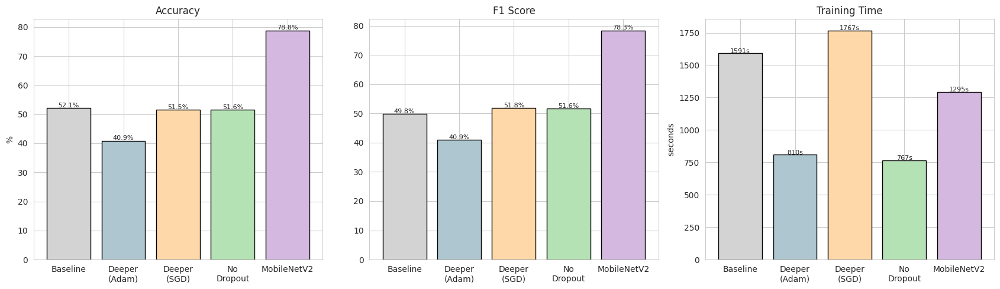

In [68]:
# final bar charts
all_models = ['Baseline', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'No\nDropout', 'MobileNetV2']
all_acc = [baseline_results['accuracy'], deeper_results['accuracy'], acc_sgd, acc_abl, acc_tl]
all_f1 = [baseline_results['f1_score'], deeper_results['f1_score'], f1_sgd, f1_abl, f1_tl]
all_times = [baseline_results['training_time_sec'], deeper_results['training_time_sec'], sgd_time, abl_time, tl_total_time]
colors = ['#D3D3D3', '#AEC6CF', '#FFD8A9', '#B5E2B5', '#D4B8E0']

fig, axes = plt.subplots(1, 3, figsize=(17, 5))

axes[0].bar(all_models, [a*100 for a in all_acc], color=colors, edgecolor='black')
axes[0].set_title('Accuracy')
axes[0].set_ylabel('%')
for i, v in enumerate(all_acc):
    axes[0].text(i, v*100+0.3, f'{v*100:.1f}%', ha='center', fontsize=8)

axes[1].bar(all_models, [f*100 for f in all_f1], color=colors, edgecolor='black')
axes[1].set_title('F1 Score')
for i, v in enumerate(all_f1):
    axes[1].text(i, v*100+0.3, f'{v*100:.1f}%', ha='center', fontsize=8)

axes[2].bar(all_models, all_times, color=colors, edgecolor='black')
axes[2].set_title('Training Time')
axes[2].set_ylabel('seconds')
for i, v in enumerate(all_times):
    axes[2].text(i, v+2, f'{v:.0f}s', ha='center', fontsize=8)

plt.tight_layout()
plt.show()

## 8. Save Models to Drive

In [ ]:
import pickle

SAVE_DIR = '/content/drive/MyDrive/food11_models'
os.makedirs(SAVE_DIR, exist_ok=True)

baseline_model.save(f'{SAVE_DIR}/baseline_cnn.keras')
deeper_model.save(f'{SAVE_DIR}/deeper_cnn.keras')
deeper_sgd.save(f'{SAVE_DIR}/deeper_sgd.keras')
ablation_model.save(f'{SAVE_DIR}/ablation.keras')
tl_model.save(f'{SAVE_DIR}/mobilenetv2_tl.keras')

all_results = {
    'baseline': baseline_results,
    'deeper': deeper_results,
    'sgd': {'accuracy': acc_sgd, 'precision': prec_sgd, 'recall': rec_sgd,
            'f1_score': f1_sgd, 'eval_loss': sgd_loss, 'time': sgd_time,
            'history': sgd_history.history},
    'ablation': {'accuracy': acc_abl, 'precision': prec_abl, 'recall': rec_abl,
                 'f1_score': f1_abl, 'eval_loss': abl_loss, 'time': abl_time,
                 'history': ablation_history.history},
    'transfer': {'accuracy': acc_tl, 'precision': prec_tl, 'recall': rec_tl,
                 'f1_score': f1_tl, 'eval_loss': tl_loss_val, 'time': tl_total_time,
                 'hist1': tl_hist1.history}
}
with open(f'{SAVE_DIR}/all_results.pkl', 'wb') as f:
    pickle.dump(all_results, f)

print(f"everything saved to {SAVE_DIR}")

everything saved to /content/drive/MyDrive/food11_models


In [66]:
# cell to load everything back if colab disconnects
# run the mount drive + extract + data generators cells first, then this

import pickle
from tensorflow.keras.models import load_model

SAVE_DIR = '/content/drive/MyDrive/food11_models'

baseline_model = load_model(f'{SAVE_DIR}/baseline_cnn.keras')
deeper_model = load_model(f'{SAVE_DIR}/deeper_cnn.keras')
deeper_sgd = load_model(f'{SAVE_DIR}/deeper_sgd.keras')
ablation_model = load_model(f'{SAVE_DIR}/ablation.keras')
tl_model = load_model(f'{SAVE_DIR}/mobilenetv2_tl.keras')

with open(f'{SAVE_DIR}/all_results.pkl', 'rb') as f:
    r = pickle.load(f)

baseline_results = r['baseline']
deeper_results = r['deeper']
acc_sgd, prec_sgd, rec_sgd, f1_sgd = r['sgd']['accuracy'], r['sgd']['precision'], r['sgd']['recall'], r['sgd']['f1_score']
sgd_loss, sgd_time = r['sgd']['eval_loss'], r['sgd']['time']
acc_abl, prec_abl, rec_abl, f1_abl = r['ablation']['accuracy'], r['ablation']['precision'], r['ablation']['recall'], r['ablation']['f1_score']
abl_loss, abl_time = r['ablation']['eval_loss'], r['ablation']['time']
acc_tl, prec_tl, rec_tl, f1_tl = r['transfer']['accuracy'], r['transfer']['precision'], r['transfer']['recall'], r['transfer']['f1_score']
tl_loss_val, tl_total_time = r['transfer']['eval_loss'], r['transfer']['time']

print("loaded everything from drive, no need to retrain")

loaded everything from drive, no need to retrain
